# 二重矢板の予測（回帰モデル）

In [ ]:
# ライブラリのインポート
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats
from sklearn import preprocessing
import japanize_matplotlib
# LightGBM
import lightgbm as lgb
import optuna
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder

## 1.CSVファイルの読み込み

In [115]:
#データの読み込み
data_folder = input("データファイルのあるフォルダまでのパス")
data_folder = data_folder.rstrip()
data_folder = data_folder.replace("\\", "/") + "/"
    
file = data_folder + "input20001_30000_input+error.csv"
# file1 = data_folder + "train_data1.csv"
# file2 = data_folder + "train_labels.csv"

df = pd.read_csv(file,encoding="shift-jis")


# df1 = pd.read_csv(file1,encoding="cp932")
# df2 = pd.read_csv(file2,encoding="cp932")

# df = pd.concat([df1,df2],axis = 1)

In [117]:
pd.set_option('display.max_columns',50)
df

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,根入れ深さ,せん断変形破壊_label,滑動、支持力_label,根入れ部の安定_label,遮水効果_label,矢板の耐力照査_label,タイロッドの耐力照査_label,腹起しの耐力照査_label
0,20,5.7,4.0,3.9,0.0,0.0,1.6,12,1,7,24,165,179400,12,1,20,42,190,0,390,35,1,1,0.1,0.0,0.001200,0.016980,0.001000,0.030435,0.000000,0.000000,0.000000,6.9,0.5,5,2.9,0,0,0,0,0,0,0
1,29,8.2,6.8,6.7,3.1,0.0,1.6,20,0,28,7,242,59700,13,0,43,28,192,1,390,67,0,1,4.3,0.0,0.027998,0.074074,0.049689,0.693069,0.055319,0.023256,0.010811,12.0,5.7,4,5.2,0,0,0,0,0,0,0
2,23,13.3,9.7,9.6,0.0,0.8,1.6,18,1,27,7,136,139100,17,0,35,22,9,2,390,28,1,0,8.4,0.1,0.237154,0.195440,0.236220,1.250000,0.353191,1.818182,0.614286,13.3,7.1,0,3.6,0,0,0,3,0,3,0
3,13,10.6,8.5,8.4,0.0,1.0,1.6,12,0,11,21,272,118900,15,1,42,34,69,0,295,90,1,1,3.0,0.2,0.001200,0.030083,0.020192,0.360825,0.005556,0.000000,0.000000,12.4,4.9,2,3.9,0,0,0,0,0,0,0
4,17,11.8,5.9,5.8,0.0,0.9,0.8,16,0,21,35,10,59000,15,0,2,27,70,0,390,40,1,1,5.5,0.4,0.070217,0.268456,0.235756,0.498575,0.046809,0.078431,0.016216,15.7,2.7,1,9.8,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,25,11.7,6.2,6.1,0.0,0.3,1.6,17,_Sandy,44,1,176,76500,15,_Sandy,49,33,247,1,_SY390,88,1,1,1.6,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.3,1.7,8,4.1,3,3,3,3,3,3,3
9996,13,10.0,5.4,5.3,1.8,0.0,1.6,14,_Clay,0,45,156,192100,17,_Sandy,26,16,66,2,_SY390,40,0,0,4.4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,3.0,4,2.7,3,3,3,3,3,3,3
9997,23,9.2,5.0,4.9,1.7,0.0,1.6,19,_Sandy,27,6,0,166900,16,_Sandy,23,33,10,1,_SY295,64,1,0,2.8,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.6,2.6,0,2.6,3,3,3,3,3,3,3
9998,13,11.9,9.3,9.2,1.6,0.0,0.8,14,_Clay,2,43,260,95300,16,_Sandy,45,31,11,2,_SY390,53,1,1,2.3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.8,2.8,1,2.5,3,3,3,3,3,3,3


## ラベルエンコーディング

In [118]:
def label_en(label):
    label = label.astype("category")
    le_embarked = LabelEncoder()
    le_embarked.fit(label)
    return le_embarked.transform(label)
#タイプ3:0，タイプ4:1，タイプ5:2
df['矢板型'] = label_en(df['矢板型'])
#SY295:0，SY390:1
df['矢板材料'] = label_en(df['矢板材料'])
df['腹起し番号'] = label_en(df["腹起し番号"])
df['引張材材料番号'] = label_en(df["引張材材料番号"])	
df['腹起し材質'] = label_en(df["腹起し材質"])	
df['中詰め区分'] = label_en(df["中詰め区分"])
df['在来地盤区分'] = label_en(df["在来地盤区分"])

In [119]:
pd.set_option('display.max_columns',50)
df

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,根入れ深さ,せん断変形破壊_label,滑動、支持力_label,根入れ部の安定_label,遮水効果_label,矢板の耐力照査_label,タイロッドの耐力照査_label,腹起しの耐力照査_label
0,20,5.7,4.0,3.9,0.0,0.0,1.6,12,1,7,24,165,179400,12,3,20,42,190,0,3,35,1,1,0.1,0.0,0.001200,0.016980,0.001000,0.030435,0.000000,0.000000,0.000000,6.9,0.5,5,2.9,0,0,0,0,0,0,0
1,29,8.2,6.8,6.7,3.1,0.0,1.6,20,0,28,7,242,59700,13,2,43,28,192,1,3,67,0,1,4.3,0.0,0.027998,0.074074,0.049689,0.693069,0.055319,0.023256,0.010811,12.0,5.7,4,5.2,0,0,0,0,0,0,0
2,23,13.3,9.7,9.6,0.0,0.8,1.6,18,1,27,7,136,139100,17,2,35,22,9,2,3,28,1,0,8.4,0.1,0.237154,0.195440,0.236220,1.250000,0.353191,1.818182,0.614286,13.3,7.1,0,3.6,0,0,0,3,0,3,0
3,13,10.6,8.5,8.4,0.0,1.0,1.6,12,0,11,21,272,118900,15,3,42,34,69,0,2,90,1,1,3.0,0.2,0.001200,0.030083,0.020192,0.360825,0.005556,0.000000,0.000000,12.4,4.9,2,3.9,0,0,0,0,0,0,0
4,17,11.8,5.9,5.8,0.0,0.9,0.8,16,0,21,35,10,59000,15,2,2,27,70,0,3,40,1,1,5.5,0.4,0.070217,0.268456,0.235756,0.498575,0.046809,0.078431,0.016216,15.7,2.7,1,9.8,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,25,11.7,6.2,6.1,0.0,0.3,1.6,17,_Sandy,44,1,176,76500,15,1,49,33,247,1,1,88,1,1,1.6,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.3,1.7,8,4.1,3,3,3,3,3,3,3
9996,13,10.0,5.4,5.3,1.8,0.0,1.6,14,_Clay,0,45,156,192100,17,1,26,16,66,2,1,40,0,0,4.4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1,3.0,4,2.7,3,3,3,3,3,3,3
9997,23,9.2,5.0,4.9,1.7,0.0,1.6,19,_Sandy,27,6,0,166900,16,1,23,33,10,1,0,64,1,0,2.8,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.6,2.6,0,2.6,3,3,3,3,3,3,3
9998,13,11.9,9.3,9.2,1.6,0.0,0.8,14,_Clay,2,43,260,95300,16,1,45,31,11,2,1,53,1,1,2.3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.8,2.8,1,2.5,3,3,3,3,3,3,3


In [114]:
pd.set_option('display.max_columns',50)
df.head()

,Unnamed: 0,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,根入れ深さ,せん断変形破壊_label,滑動、支持力_label,根入れ部の安定_label,遮水効果_label,矢板の耐力照査_label,タイロッドの耐力照査_label,腹起しの耐力照査_label
0,0,20,5.7,4.0,3.9,0.0,0.0,1.6,12,1,7,24,165,179400,12,3,20,42,190,0,3,35,1,1,0.1,0.0,0.001200,0.016980,0.001000,0.030435,0.000000,0.000000,0.000000,6.9,0.5,5,2.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,29,8.2,6.8,6.7,3.1,0.0,1.6,20,0,28,7,242,59700,13,2,43,28,192,1,3,67,0,1,4.3,0.0,0.027998,0.074074,0.049689,0.693069,0.055319,0.023256,0.010811,12.0,5.7,4,5.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,23,13.3,9.7,9.6,0.0,0.8,1.6,18,1,27,7,136,139100,17,2,35,22,9,2,3,28,1,0,8.4,0.1,0.237154,0.195440,0.236220,1.250000,0.353191,1.818182,0.614286,13.3,7.1,0,3.6,0.0,0.0,0.0,3.0,0.0,3.0,0.0
3,3,13,10.6,8.5,8.4,0.0,1.0,1.6,12,0,11,21,272,118900,15,3,42,34,69,0,2,90,1,1,3.0,0.2,0.001200,0.030083,0.020192,0.360825,0.005556,0.000000,0.000000,12.4,4.9,2,3.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,17,11.8,5.9,5.8,0.0,0.9,0.8,16,0,21,35,10,59000,15,2,2,27,70,0,3,40,1,1,5.5,0.4,0.070217,0.268456,0.235756,0.498575,0.046809,0.078431,0.016216,15.7,2.7,1,9.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
pd.set_option('display.max_columns',40)
df.head()

## 相関を調べる

In [ ]:
# 目的変数の設定
pur = "矢板の全長"

In [ ]:
# sns.set(rc = {'figure.figsize':(15,8)})
sns.set(font='Yu Gothic')
plt.figure(figsize=(20,20),dpi=200)
p=sns.heatmap(df.corr(),square=True, vmax=1, vmin=-1, center=0,cmap='coolwarm')

In [ ]:
sns.set(font='Yu Gothic',rc = {'figure.figsize':(20,20)})
sns.heatmap(df.corr()[[pur]].sort_values(by=pur, ascending=False)[1:],cmap='coolwarm', annot=True)

In [ ]:
df

In [ ]:
#目的変数の分布
def plot_histgram(x, title=None, x_label=None):
    fig,ax = plt.subplots()
    sns.set(font='Yu Gothic',rc = {'figure.figsize':(12,6)})

    plt.figure(figsize=(8,8),dpi=500)
    sns.histplot(x, kde = False, ax=ax)
    fig.suptitle(title)
    ax.set_xlabel(x_label)

    fig.show()

plot_histgram(df[pur], title="目的変数の分布", x_label=pur)

In [ ]:
df[pur].describe()

In [ ]:
#目的変数と各特徴量の関係
def plt_scatters(X, y, title = None,nrows=2,ncols=2):
    # sns.set(rc = {'figure.figsize':(15,8)})
    sns.set(font='Yu Gothic',rc = {'figure.figsize':(30,30)})

    cols = X.columns
    plt.figure(figsize=(4,4),dpi=200)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

    for ax,c in zip(axes.ravel(),cols):
        sns.scatterplot(X[c], y , ci=None, ax=ax)
        ax.set(ylabel = y.name)
    

    fig.suptitle(title)
    fig.show()

xx = df.drop([pur], axis = 1)
plt_scatters(
    df[xx.columns],
    df[pur],
    title = "目的変数と各特徴量との関係",
    nrows = 7,
    ncols = 5
)

In [ ]:
plt_scatters(
    df[['左右壁体高さ','堤外側水位_常時']],
    df['中詰土天端高さ'],
    title = "目的変数と各特徴量との関係",
    nrows = 2,
    ncols = 1
)

## モデルの作成

### データの分割

In [ ]:
# データの分割
# 全体の20%をテストデータに設定

from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state = 3)

In [ ]:
# Stratified K Foldでデータを分割
from imblearn.under_sampling import RandomUnderSampler
# 目的変数と説明変数に分ける
x_train = train.drop([pur], axis = 1) # 予測対象以外を説明変数に設定
y_train = train.loc[:,pur]

### 交差検証

In [ ]:
# Stratified K Foldでデータを分割
from imblearn.under_sampling import RandomUnderSampler
# 目的変数と説明変数に分ける
X = train.drop([pur], axis = 1) # 予測対象以外を説明変数に設定
y = train.loc[:,pur]

# データの分割
# ライブラリのインポート
from sklearn.model_selection import KFold

fold = KFold(n_splits=5, shuffle=True, random_state=3) # データを5分割する
kf = fold.split(X, y)
kf_cv = list(kf)

In [ ]:
for i, (idx_train, idx_val) in enumerate(kf_cv):
    print(f'fold {i}')
    print(idx_train)
    print(idx_val)
    print('=='*30)
    print(len(idx_train), len(idx_val)) #5分割しているのでデータ数が1:4になるか確認する
    print('=='*30)

## LightGBM

In [ ]:
# from xgboost.callback import early_stop
from sklearn import metrics # 正解率を出すためのライブラリ
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV,StratifiedKFold,cross_val_score

### ハイパーパラメータチューニング

In [ ]:
params_base = {
    "boosting_type": "gbdt",
    'objective': 'regression_l1', 
    'metric': 'mean_absolute_error',
    'n_estimators': 1000,
    "subsample":0.7,
    'subsample_freq': 1,
    "seed": 123,
    "importance_type":"gain"
}

In [ ]:
def objective(trial, df_X, df_y):

    params_tuning = {
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 8, 256),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 5, 200),
        "min_sum_hessian_in_leaf": trial.suggest_float("min_sum_hessian_in_leaf", 5, 200),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.5, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.5, 1.0),
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-2, 1e2, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-2, 1e2, log=True)
    }

    params_tuning.update(params_base)


    model = lgb.LGBMRegressor(verbosity=2,
                             n_jobs=-1,
                             random_state=42,
                             **params_tuning)

    # 交差検証
    scores = cross_val_score(
        model, df_X, df_y, scoring='neg_mean_squared_error', cv=5)
    rmse = np.sqrt(-scores)
    score_mean = np.mean(rmse)

    return score_mean


In [85]:
#optuna.create_study()でoptuna.studyインスタンスを作る。
study = optuna.create_study()

#studyインスタンスのoptimize()に作った関数を渡して最適化する。
study.optimize(lambda trial: objective(trial,X,y),n_trials=200, timeout=300)


[LightGBM] [Debug] Re-bagging, using 5031 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 13
[LightGBM] [Debug] Re-bagging, using 5087 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 9
[LightGBM] [Debug] Re-bagging, using 5049 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 11
[LightGBM] [Debug] Re-bagging, using 4995 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Debug] Re-bagging, using 4993 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 10
[LightGBM] [Debu

[I 2022-08-18 22:48:36,988] Trial 37 finished with value: 1.7288839190002698 and parameters: {'learning_rate': 0.03345107358520693, 'num_leaves': 103, 'min_data_in_leaf': 70, 'min_sum_hessian_in_leaf': 80.52864396137029, 'feature_fraction': 0.6345479508551741, 'bagging_fraction': 0.8806695439438695, 'lambda_l1': 0.6403932217671615, 'lambda_l2': 0.23995010466666386}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 5024 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 16
[LightGBM] [Debug] Re-bagging, using 5024 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 10
[LightGBM] [Debug] Re-bagging, using 5055 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Debug] Re-bagging, using 5054 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 14
[LightGBM] [Debug] Re-bagging, using 5012 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 14
[LightGBM] [Deb

[I 2022-08-18 22:48:43,699] Trial 38 finished with value: 1.744104919031901 and parameters: {'learning_rate': 0.06620830146050069, 'num_leaves': 134, 'min_data_in_leaf': 48, 'min_sum_hessian_in_leaf': 85.08374926384552, 'feature_fraction': 0.6189149150524045, 'bagging_fraction': 0.9858025829683227, 'lambda_l1': 0.23680734291265862, 'lambda_l2': 0.6652594323316631}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Warning] seed is set=123, random_state=42 will be ignored. Current value: seed=123
[LightGBM] [Warning] feature_fraction is set=0.7887678583926151, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7887678583926151
[LightGBM] [Warning] min_data_in_leaf is set=79, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=79
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=141.4576576954341, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=141.4576576954341
[LightGBM] [Warning] bagging_fraction is set=0.8073663760163665, subsample=0.7 will be ignored. Current value: bagging_fraction=0.8073663760163665
[LightGBM] [Warning] lambda_l1 is set=0.8270149707132548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270149707132548
[LightGBM] [Warning] lambda_l2 is set=0.01883935973577529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01883935973577529
[LightGBM] [Warning] seed is set=123, random_

[I 2022-08-18 22:48:48,879] Trial 39 finished with value: 1.7449302856034403 and parameters: {'learning_rate': 0.04922463665092437, 'num_leaves': 211, 'min_data_in_leaf': 79, 'min_sum_hessian_in_leaf': 141.4576576954341, 'feature_fraction': 0.7887678583926151, 'bagging_fraction': 0.8073663760163665, 'lambda_l1': 0.8270149707132548, 'lambda_l2': 0.01883935973577529}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 13
[LightGBM] [Debug] Re-bagging, using 4582 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 11
[LightGBM] [Debug] Re-bagging, using 4613 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Debug] Re-bagging, using 4581 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 9
[LightGBM] [Debug] Re-bagging, using 4580 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Debug] Re-bagging, using 4595 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debu

[I 2022-08-18 22:48:54,736] Trial 40 finished with value: 1.7380796373673557 and parameters: {'learning_rate': 0.03927447948528378, 'num_leaves': 151, 'min_data_in_leaf': 69, 'min_sum_hessian_in_leaf': 64.26647622631954, 'feature_fraction': 0.6766001279951258, 'bagging_fraction': 0.6596892888369786, 'lambda_l1': 0.08580313938643994, 'lambda_l2': 0.075173437109986}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 3804 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 15
[LightGBM] [Debug] Re-bagging, using 3796 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 9
[LightGBM] [Debug] Re-bagging, using 3752 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 16
[LightGBM] [Debug] Re-bagging, using 3741 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 13
[LightGBM] [Debug] Re-bagging, using 3735 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 16
[LightGBM] [Debu

[I 2022-08-18 22:49:02,512] Trial 41 finished with value: 1.7213769812834205 and parameters: {'learning_rate': 0.07331273231975903, 'num_leaves': 124, 'min_data_in_leaf': 35, 'min_sum_hessian_in_leaf': 49.054104864611645, 'feature_fraction': 0.7252802133225249, 'bagging_fraction': 0.7438799914394572, 'lambda_l1': 1.7828717325265178, 'lambda_l2': 0.027845383653382606}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Warning] seed is set=123, random_state=42 will be ignored. Current value: seed=123
[LightGBM] [Warning] feature_fraction is set=0.7225828113449537, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7225828113449537
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=18.1721609878858, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=18.1721609878858
[LightGBM] [Warning] bagging_fraction is set=0.7793169328522518, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7793169328522518
[LightGBM] [Warning] lambda_l1 is set=3.4642331848662997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642331848662997
[LightGBM] [Warning] lambda_l2 is set=0.02114202607878189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02114202607878189
[LightGBM] [Warning] seed is set=123, random_st

[I 2022-08-18 22:49:12,458] Trial 42 finished with value: 1.7512480492318268 and parameters: {'learning_rate': 0.07636559388226408, 'num_leaves': 124, 'min_data_in_leaf': 33, 'min_sum_hessian_in_leaf': 18.1721609878858, 'feature_fraction': 0.7225828113449537, 'bagging_fraction': 0.7793169328522518, 'lambda_l1': 3.4642331848662997, 'lambda_l2': 0.02114202607878189}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 4431 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 102 and depth = 18
[LightGBM] [Debug] Re-bagging, using 4459 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 96 and depth = 17
[LightGBM] [Debug] Re-bagging, using 4503 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 103 and depth = 12
[LightGBM] [Warning] seed is set=123, random_state=42 will be ignored. Current value: seed=123
[LightGBM] [Warning] feature_fraction is set=0.7608859337885163, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7608859337885163
[LightGBM] [Warning] min_data_in_leaf is set=44, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=44
[LightGBM] [Warning] min_sum_hessian

[I 2022-08-18 22:49:18,378] Trial 43 finished with value: 1.7279925935014808 and parameters: {'learning_rate': 0.06371432850276483, 'num_leaves': 126, 'min_data_in_leaf': 44, 'min_sum_hessian_in_leaf': 36.04729868790046, 'feature_fraction': 0.7608859337885163, 'bagging_fraction': 0.6210244617979067, 'lambda_l1': 8.71458229836348, 'lambda_l2': 0.1141991460490956}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Warning] seed is set=123, random_state=42 will be ignored. Current value: seed=123
[LightGBM] [Warning] feature_fraction is set=0.6782593360542368, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6782593360542368
[LightGBM] [Warning] min_data_in_leaf is set=53, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=53
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=48.777186139113844, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=48.777186139113844
[LightGBM] [Warning] bagging_fraction is set=0.8211962483710351, subsample=0.7 will be ignored. Current value: bagging_fraction=0.8211962483710351
[LightGBM] [Warning] lambda_l1 is set=1.1702865412231613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1702865412231613
[LightGBM] [Warning] lambda_l2 is set=0.010191848689816502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010191848689816502
[LightGBM] [Warning] seed is set=123, ran

[I 2022-08-18 22:49:26,846] Trial 44 finished with value: 1.739950185391093 and parameters: {'learning_rate': 0.08745290096449387, 'num_leaves': 67, 'min_data_in_leaf': 53, 'min_sum_hessian_in_leaf': 48.777186139113844, 'feature_fraction': 0.6782593360542368, 'bagging_fraction': 0.8211962483710351, 'lambda_l1': 1.1702865412231613, 'lambda_l2': 0.010191848689816502}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Warning] seed is set=123, random_state=42 will be ignored. Current value: seed=123
[LightGBM] [Warning] feature_fraction is set=0.5076015893884349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5076015893884349
[LightGBM] [Warning] min_data_in_leaf is set=61, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=61
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=93.30444646663227, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=93.30444646663227
[LightGBM] [Warning] bagging_fraction is set=0.6786364176727597, subsample=0.7 will be ignored. Current value: bagging_fraction=0.6786364176727597
[LightGBM] [Warning] lambda_l1 is set=25.13728867912284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25.13728867912284
[LightGBM] [Warning] lambda_l2 is set=0.22265614069989964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22265614069989964
[LightGBM] [Warning] seed is set=123, random_st

[I 2022-08-18 22:49:30,807] Trial 45 finished with value: 1.7870319097404728 and parameters: {'learning_rate': 0.07763064586103297, 'num_leaves': 140, 'min_data_in_leaf': 61, 'min_sum_hessian_in_leaf': 93.30444646663227, 'feature_fraction': 0.5076015893884349, 'bagging_fraction': 0.6786364176727597, 'lambda_l1': 25.13728867912284, 'lambda_l2': 0.22265614069989964}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 3886 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 7
[LightGBM] [Debug] Re-bagging, using 3885 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 7
[LightGBM] [Debug] Re-bagging, using 3935 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 7
[LightGBM] [Debug] Re-bagging, using 3861 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 7
[LightGBM] [Debug] Re-bagging, using 3920 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 10
[LightGBM] [Debug] 

[I 2022-08-18 22:49:37,911] Trial 46 finished with value: 1.7266509542531856 and parameters: {'learning_rate': 0.06141029751935988, 'num_leaves': 98, 'min_data_in_leaf': 22, 'min_sum_hessian_in_leaf': 80.66961617495689, 'feature_fraction': 0.8325157366032142, 'bagging_fraction': 0.7342803787362395, 'lambda_l1': 0.3871864496432464, 'lambda_l2': 1.8108025736152427}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 4160 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 7
[LightGBM] [Debug] Re-bagging, using 4147 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 11
[LightGBM] [Debug] Re-bagging, using 4148 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 9
[LightGBM] [Debug] Re-bagging, using 4232 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 16
[LightGBM] [Debug] Re-bagging, using 4235 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 12
[LightGBM] [Warni

[I 2022-08-18 22:49:42,275] Trial 47 finished with value: 1.7207116253361174 and parameters: {'learning_rate': 0.0565474967725214, 'num_leaves': 29, 'min_data_in_leaf': 86, 'min_sum_hessian_in_leaf': 55.97164014485705, 'feature_fraction': 0.7523547927602395, 'bagging_fraction': 0.7672106234023706, 'lambda_l1': 0.5280110122629569, 'lambda_l2': 0.04253635670432186}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 4397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 9
[LightGBM] [Debug] Re-bagging, using 4369 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 14
[LightGBM] [Debug] Re-bagging, using 4409 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 11
[LightGBM] [Debug] Re-bagging, using 4400 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 8
[LightGBM] [Debug] Re-bagging, using 4362 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 10
[LightGBM] [Debug] Re-bagging, using 4414 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 10
[LightGBM] [Debug] Re-bagging, using 4376 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 13
[LightGBM] [Debug] Re-bagging, using 4348 data to train
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 10
[LightGBM] [Debug] Re-bagg

[I 2022-08-18 22:49:44,862] Trial 48 finished with value: 1.7588143995120311 and parameters: {'learning_rate': 0.05577192678878525, 'num_leaves': 9, 'min_data_in_leaf': 86, 'min_sum_hessian_in_leaf': 5.701883243446197, 'feature_fraction': 0.7582131141434649, 'bagging_fraction': 0.7631911355881349, 'lambda_l1': 4.951605154924129, 'lambda_l2': 0.05313019812874213}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Debug] Re-bagging, using 4393 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 4381 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Debug] Re-bagging, using 4344 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Debug] Re-bagging, using 4397 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 4343 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 4333 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Debug] Re-bagging, using 4324 data to train
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Debug] Re-bagging, using 4346 data to train
[LightGBM] [Debug] Trained a tree with l

[I 2022-08-18 22:49:49,174] Trial 49 finished with value: 1.75223726951414 and parameters: {'learning_rate': 0.043660401464578474, 'num_leaves': 80, 'min_data_in_leaf': 124, 'min_sum_hessian_in_leaf': 56.36507972914555, 'feature_fraction': 0.787329929165469, 'bagging_fraction': 0.6392079407968276, 'lambda_l1': 1.8497345459903909, 'lambda_l2': 0.6122579068719717}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 3654 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 8
[LightGBM] [Debug] Re-bagging, using 3654 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 9
[LightGBM] [Debug] Re-bagging, using 3577 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 6
[LightGBM] [Debug] Re-bagging, using 3668 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 7
[LightGBM] [Debug] Re-bagging, using 3668 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 12
[LightGBM] [Debug] 

[I 2022-08-18 22:49:52,592] Trial 50 finished with value: 1.787584534590367 and parameters: {'learning_rate': 0.09341609187201694, 'num_leaves': 30, 'min_data_in_leaf': 198, 'min_sum_hessian_in_leaf': 65.21592025809849, 'feature_fraction': 0.8949890020825709, 'bagging_fraction': 0.7257046328811562, 'lambda_l1': 2.920934064242355, 'lambda_l2': 0.1362562473812395}. Best is trial 23 with value: 1.7201717942592691.


[LightGBM] [Debug] Re-bagging, using 4113 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 7
[LightGBM] [Debug] Re-bagging, using 4159 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 6
[LightGBM] [Debug] Re-bagging, using 4188 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Debug] Re-bagging, using 4122 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 9
[LightGBM] [Debug] Re-bagging, using 4116 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Debug] R

In [90]:
params_best = study.best_params
params_best.update(params_base)
display(params_best)

{'learning_rate': 0.06242072136333551,
 'num_leaves': 141,
 'min_data_in_leaf': 52,
 'min_sum_hessian_in_leaf': 42.50714460508751,
 'feature_fraction': 0.772911713120115,
 'bagging_fraction': 0.7852376018534182,
 'lambda_l1': 4.406198672176831,
 'lambda_l2': 0.056155598130314635,
 'boosting_type': 'gbdt',
 'objective': 'regression_l1',
 'metric': 'mean_absolute_error',
 'n_estimators': 1000,
 'subsample': 0.7,
 'subsample_freq': 1,
 'seed': 123,
 'importance_type': 'gain'}

In [91]:
#スコアを見る
print(study.best_params)    

{'learning_rate': 0.06242072136333551, 'num_leaves': 141, 'min_data_in_leaf': 52, 'min_sum_hessian_in_leaf': 42.50714460508751, 'feature_fraction': 0.772911713120115, 'bagging_fraction': 0.7852376018534182, 'lambda_l1': 4.406198672176831, 'lambda_l2': 0.056155598130314635}


In [92]:
print(study.best_value)

1.7201717942592691


In [ ]:
# xgb_params = {
#     'objective': 'reg:squarederror',  # 回帰問題
#     'eval_metric': 'rmse',       # 学習用の指標
# }

In [ ]:
# xgb_params['max_depth'] = study.best_params['max_depth']
# xgb_params['min_child_weight'] = study.best_params['min_child_weight']
# xgb_params['gamma'] = study.best_params['gamma']
# xgb_params['subsample'] = study.best_params['subsample']
# xgb_params['colsample_bytree'] = study.best_params['colsample_bytree']
# xgb_params['learning_rate'] = study.best_params['learning_rate']
# # xgb_params['reg_alpha'] = study.best_params['reg_alpha']
# # xgb_params['reg_lambda'] = study.best_params['reg_lambda']

### 学習開始

In [93]:
from sklearn.metrics import average_precision_score,mean_absolute_error
import shap

def fit_lgb(X, y, cv, params: dict=None):
    models = []
    ma = []
    r = []
    # acc = []
    oof = np.zeros(len(X))
    # oof_classfication = np.zeros(len(X))

    if params is None:
        params = {}

    for i, (idx_train, idx_val) in enumerate(kf_cv):
        X_train, y_train = X.iloc[idx_train], y.iloc[idx_train] # 学習用の説明変数と目的変数の呼び出し
        X_val, y_val = X.iloc[idx_val], y.iloc[idx_val]

        reg = lgb.LGBMRegressor(**params)
        model = reg.fit(X_train, y_train,
                        eval_set=[(X_val, y_val)],  
                        early_stopping_rounds=20,
                        verbose = 2)

        pred = model.predict(X_val)
        oof[idx_val] = pred

        models.append(model)
        
        explainer = shap.TreeExplainer(model = model,data=X_train,feature_perturbation="interventional")
        shap_values = explainer(X_train)
        shap.plots.bar(shap_values=shap_values,max_display=6)
        shap.plots.beeswarm(shap_values,max_display=6)
        
        print('r2_train:',reg.score(X_train, y_train))
        print('r2_val:',reg.score(X_val, y_val))
        print('MAE_val: ',mean_absolute_error(y_val, pred))
        # print('Acc_val: ',metrics.accuracy_score(y_val, pred))
        ma.append(metrics.mean_absolute_error(y_val, pred))
        # acc.append(metrics.accuracy_score(y_val, pred))
        r.append(reg.score(X_val, y_val))

    print(f'平均のMAE：{np.mean(ma)}')
    print(f'平均のR2：{np.mean(r)}')
    # print(f'平均のAcc：{np.mean(acc)}')
    return oof, models

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] feature_fraction is set=0.772911713120115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.772911713120115
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] lambda_l1 is set=4.406198672176831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.406198672176831
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=42.50714460508751, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=42.50714460508751
[LightGBM] [Warning] bagging_fraction is set=0.7852376018534182, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7852376018534182
[LightGBM] [Warning] lambda_l2 is set=0.056155598130314635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056155598130314635
[2]	valid_0's l1: 2.77337
[4]	valid_0's l1: 2.63988
[6]	valid_0's l1: 2.49705
[8]	valid_0's l1: 2.40408
[10]	valid_0's l1: 2.32767
[12]	valid_

100%|===================| 5702/5713 [05:08<00:00]        

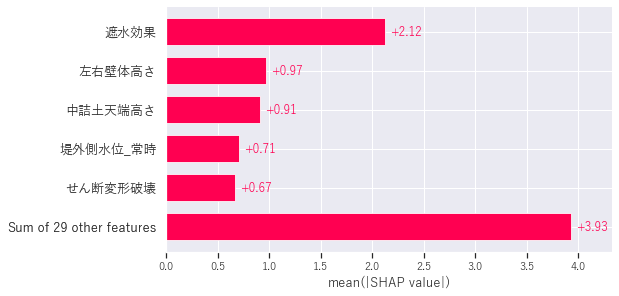

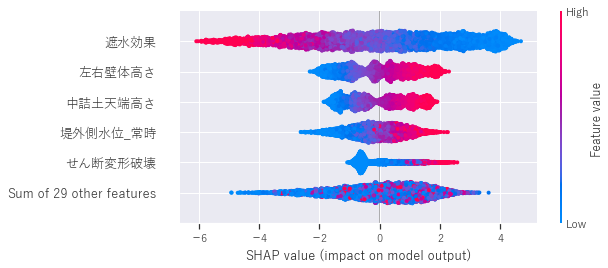

r2_train: 0.9058634512481654
r2_val: 0.7747025666013017
MAE_val:  1.1865384551688498
[LightGBM] [Warning] feature_fraction is set=0.772911713120115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.772911713120115
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] lambda_l1 is set=4.406198672176831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.406198672176831
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=42.50714460508751, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=42.50714460508751
[LightGBM] [Warning] bagging_fraction is set=0.7852376018534182, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7852376018534182
[LightGBM] [Warning] lambda_l2 is set=0.056155598130314635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056155598130314635
[2]	valid_0's l1: 2.81549
[4]	valid_0's l1: 2.68666
[6]	v

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[146]	valid_0's l1: 1.32281
[148]	valid_0's l1: 1.32059
[150]	valid_0's l1: 1.31929
[152]	valid_0's l1: 1.31827
[154]	valid_0's l1: 1.3167
[156]	valid_0's l1: 1.31453
[158]	valid_0's l1: 1.31096
[160]	valid_0's l1: 1.31072
[162]	valid_0's l1: 1.30751
[164]	valid_0's l1: 1.30621
[166]	valid_0's l1: 1.30508
[168]	valid_0's l1: 1.30431
[170]	valid_0's l1: 1.30277
[172]	valid_0's l1: 1.30177
[174]	valid_0's l1: 1.30113
[176]	valid_0's l1: 1.29975
[178]	valid_0's l1: 1.29893
[180]	valid_0's l1: 1.2984
[182]	valid_0's l1: 1.29661
[184]	valid_0's l1: 1.29576
[186]	valid_0's l1: 1.29481
[188]	valid_0's l1: 1.29428
[190]	valid_0's l1: 1.29251
[192]	valid_0's l1: 1.29126
[194]	valid_0's l1: 1.28904
[196]	valid_0's l1: 1.28846
[198]	valid_0's l1: 1.28776
[200]	valid_0's l1: 1.28689
[202]	valid_0's l1: 1.28569
[204]	valid_0's l1: 1.28506
[206]	valid_0's l1: 1.28427
[208]	valid_0's l1: 1.28414
[210]	valid_0's l1: 1.28279
[212]	valid_0's l1: 1.28238
[214]	valid_0's l1: 1.28215
[216]	valid_0's l1: 1.

100%|===================| 5706/5713 [05:43<00:00]        

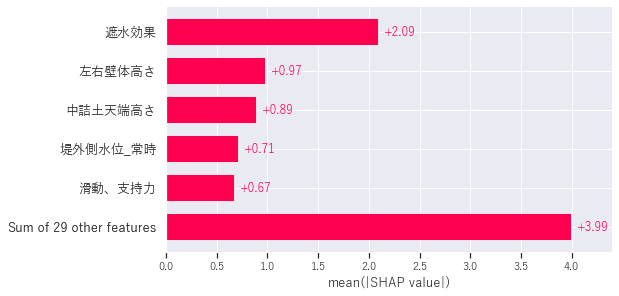

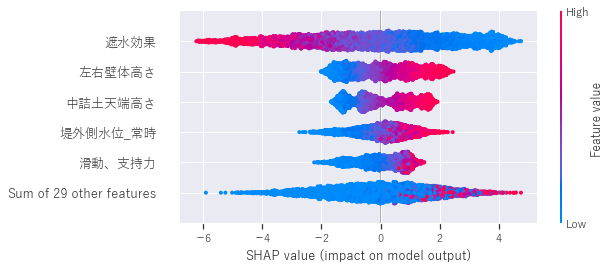

r2_train: 0.9094933561282214
r2_val: 0.7618799662771119
MAE_val:  1.2225553944781127
[LightGBM] [Warning] feature_fraction is set=0.772911713120115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.772911713120115
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] lambda_l1 is set=4.406198672176831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.406198672176831
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=42.50714460508751, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=42.50714460508751
[LightGBM] [Warning] bagging_fraction is set=0.7852376018534182, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7852376018534182
[LightGBM] [Warning] lambda_l2 is set=0.056155598130314635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056155598130314635
[2]	valid_0's l1: 2.83418
[4]	valid_0's l1: 2.70204
[6]	v

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[182]	valid_0's l1: 1.27244
[184]	valid_0's l1: 1.27151
[186]	valid_0's l1: 1.27011
[188]	valid_0's l1: 1.26906
[190]	valid_0's l1: 1.26817
[192]	valid_0's l1: 1.26727
[194]	valid_0's l1: 1.26468
[196]	valid_0's l1: 1.26479
[198]	valid_0's l1: 1.26298
[200]	valid_0's l1: 1.262
[202]	valid_0's l1: 1.26114
[204]	valid_0's l1: 1.26034
[206]	valid_0's l1: 1.2595
[208]	valid_0's l1: 1.25941
[210]	valid_0's l1: 1.25839
[212]	valid_0's l1: 1.25726
[214]	valid_0's l1: 1.25699
[216]	valid_0's l1: 1.25641
[218]	valid_0's l1: 1.256
[220]	valid_0's l1: 1.25561
[222]	valid_0's l1: 1.25485
[224]	valid_0's l1: 1.2546
[226]	valid_0's l1: 1.25369
[228]	valid_0's l1: 1.25239
[230]	valid_0's l1: 1.251
[232]	valid_0's l1: 1.25097
[234]	valid_0's l1: 1.24961
[236]	valid_0's l1: 1.24918
[238]	valid_0's l1: 1.24906
[240]	valid_0's l1: 1.24796
[242]	valid_0's l1: 1.24773
[244]	valid_0's l1: 1.2467
[246]	valid_0's l1: 1.24611
[248]	valid_0's l1: 1.24525
[250]	valid_0's l1: 1.24444
[252]	valid_0's l1: 1.24408
[

100%|===================| 5706/5714 [05:27<00:00]        

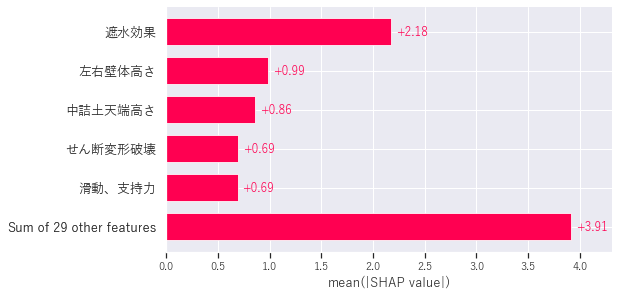

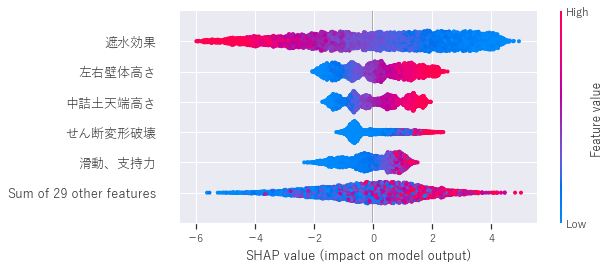

r2_train: 0.9048113744444021
r2_val: 0.7900008031413448
MAE_val:  1.1916141999679775
[LightGBM] [Warning] feature_fraction is set=0.772911713120115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.772911713120115
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] lambda_l1 is set=4.406198672176831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.406198672176831
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=42.50714460508751, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=42.50714460508751
[LightGBM] [Warning] bagging_fraction is set=0.7852376018534182, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7852376018534182
[LightGBM] [Warning] lambda_l2 is set=0.056155598130314635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056155598130314635
[2]	valid_0's l1: 2.80556
[4]	valid_0's l1: 2.66513
[6]	v

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[180]	valid_0's l1: 1.23347
[182]	valid_0's l1: 1.23275
[184]	valid_0's l1: 1.23284
[186]	valid_0's l1: 1.23129
[188]	valid_0's l1: 1.22985
[190]	valid_0's l1: 1.22942
[192]	valid_0's l1: 1.22885
[194]	valid_0's l1: 1.22757
[196]	valid_0's l1: 1.22758
[198]	valid_0's l1: 1.22627
[200]	valid_0's l1: 1.22516
[202]	valid_0's l1: 1.22411
[204]	valid_0's l1: 1.22337
[206]	valid_0's l1: 1.22164
[208]	valid_0's l1: 1.22109
[210]	valid_0's l1: 1.22109
[212]	valid_0's l1: 1.21964
[214]	valid_0's l1: 1.21859
[216]	valid_0's l1: 1.21815
[218]	valid_0's l1: 1.21718
[220]	valid_0's l1: 1.21709
[222]	valid_0's l1: 1.21619
[224]	valid_0's l1: 1.21578
[226]	valid_0's l1: 1.21536
[228]	valid_0's l1: 1.21495
[230]	valid_0's l1: 1.21444
[232]	valid_0's l1: 1.21388
[234]	valid_0's l1: 1.21334
[236]	valid_0's l1: 1.2125
[238]	valid_0's l1: 1.21158
[240]	valid_0's l1: 1.21054
[242]	valid_0's l1: 1.20993
[244]	valid_0's l1: 1.20931
[246]	valid_0's l1: 1.20827
[248]	valid_0's l1: 1.20774
[250]	valid_0's l1: 1

100%|===================| 5689/5714 [03:39<00:00]        

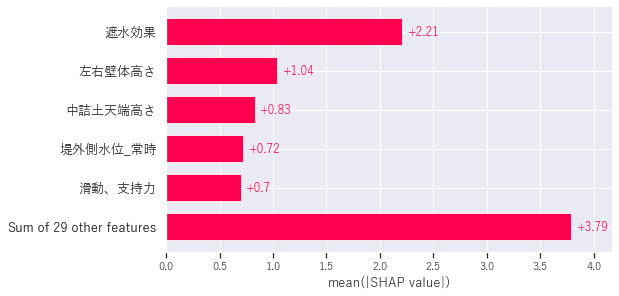

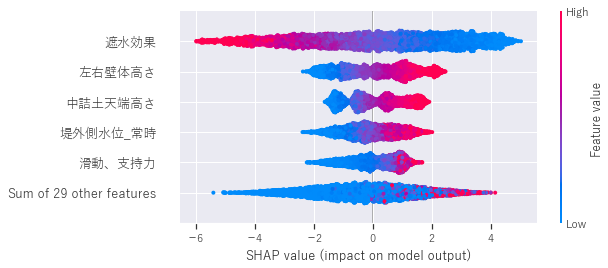

r2_train: 0.9014543759431939
r2_val: 0.785327887358966
MAE_val:  1.170779850334142
[LightGBM] [Warning] feature_fraction is set=0.772911713120115, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.772911713120115
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] lambda_l1 is set=4.406198672176831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.406198672176831
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=42.50714460508751, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=42.50714460508751
[LightGBM] [Warning] bagging_fraction is set=0.7852376018534182, subsample=0.7 will be ignored. Current value: bagging_fraction=0.7852376018534182
[LightGBM] [Warning] lambda_l2 is set=0.056155598130314635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056155598130314635
[2]	valid_0's l1: 2.84021
[4]	valid_0's l1: 2.70922
[6]	val

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[170]	valid_0's l1: 1.31598
[172]	valid_0's l1: 1.31438
[174]	valid_0's l1: 1.31313
[176]	valid_0's l1: 1.31211
[178]	valid_0's l1: 1.31174
[180]	valid_0's l1: 1.31141
[182]	valid_0's l1: 1.30985
[184]	valid_0's l1: 1.30928
[186]	valid_0's l1: 1.30798
[188]	valid_0's l1: 1.30658
[190]	valid_0's l1: 1.30551
[192]	valid_0's l1: 1.30416
[194]	valid_0's l1: 1.3032
[196]	valid_0's l1: 1.30278
[198]	valid_0's l1: 1.30221
[200]	valid_0's l1: 1.30124
[202]	valid_0's l1: 1.3002
[204]	valid_0's l1: 1.29922
[206]	valid_0's l1: 1.29832
[208]	valid_0's l1: 1.29786
[210]	valid_0's l1: 1.29728
[212]	valid_0's l1: 1.29639
[214]	valid_0's l1: 1.29593
[216]	valid_0's l1: 1.29548
[218]	valid_0's l1: 1.29508
[220]	valid_0's l1: 1.29436
[222]	valid_0's l1: 1.29325
[224]	valid_0's l1: 1.29299
[226]	valid_0's l1: 1.29225
[228]	valid_0's l1: 1.29049
[230]	valid_0's l1: 1.28997
[232]	valid_0's l1: 1.28935
[234]	valid_0's l1: 1.28804
[236]	valid_0's l1: 1.28748
[238]	valid_0's l1: 1.28743
[240]	valid_0's l1: 1.

100%|===================| 5698/5714 [05:54<00:00]        

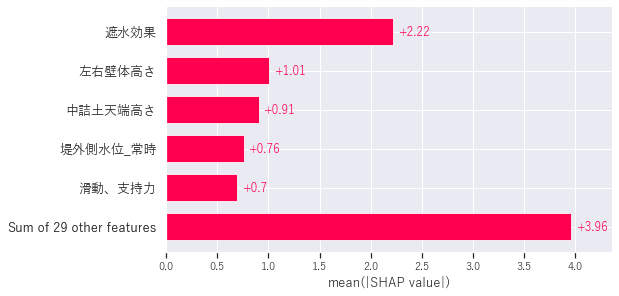

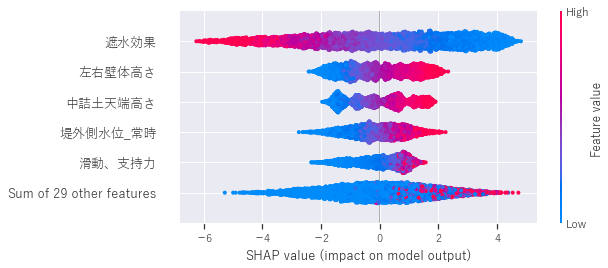

r2_train: 0.9088799731710228
r2_val: 0.7650733355366948
MAE_val:  1.2415081183823802
平均のMAE：1.2025992036662925
平均のR2：0.7753969117830838


In [94]:
oof,models = fit_lgb(X, y, kf_cv, params_best)

### テストデータ

In [95]:
X_test = test.drop([pur], axis=1)
y_test = test[pur]

In [96]:
# from sklearn.metrics import average_precision_score,mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_absolute_error

def inference_lgb(models):
    # testデータに対して推論を行う
    X_test = test.drop([pur], axis=1)
    y_test = test[pur]

    pred_test = np.zeros((5,len(y_test))) # 320×6の2次元配列を作成
    r = []
    # acc = []

    for i,model in enumerate(models):
        pred_test[i] = model.predict(X_test)/5
        r.append(model.score(X_test, y_test))
        # acc.append(metrics.accuracy_score(y_test, pred_test))
    pred_test = np.sum(pred_test, axis=0) 

    print('MAE_test: ',mean_absolute_error(y_test, pred_test))
    print('r2_test_average:',np.mean(r))
    # print('acc_average:',np.mean(acc))

    return pred_test,X_test,y_test

In [97]:
pred_test,X_test,y_test = inference_lgb(models)

MAE_test:  1.167372694645701
r2_test_average: 0.7810791766948872


### 全体の確認

In [98]:
train["predict"] = oof
train

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,predict
7109,22,6.9,2.8,2.7,0.0,0.4,1.6,16,0,9,23,134,96800,13,0,19,26,237,1,1,71,0,1,0.8,0.0,0.001200,0.015292,0.001000,0.070352,0.000000,0.000000,0.000000,9.1,0.7,7,9.421120
4291,24,7.0,2.2,2.1,0.0,0.1,0.8,15,0,2,40,216,63900,13,0,39,24,86,2,0,49,0,0,1.6,0.0,0.002000,0.016545,0.001000,0.266565,0.011111,0.023256,0.007143,8.5,0.8,4,8.401884
2105,18,8.5,6.6,6.5,1.7,0.0,0.8,15,0,5,5,240,64600,13,0,39,14,167,1,0,85,1,0,4.1,0.0,0.028839,0.059318,0.075235,1.121795,0.061111,0.009804,0.007143,7.9,5.4,0,7.502413
2942,17,2.6,9.6,9.5,0.0,4.3,1.6,17,1,17,12,128,130100,17,0,12,5,288,0,0,74,0,1,5.4,0.1,0.001200,0.124870,0.039216,0.191571,0.000000,0.000000,0.000000,16.2,6.9,5,16.815529
1931,19,4.8,7.8,7.7,2.3,0.0,1.6,19,0,43,16,84,134500,15,0,43,17,32,0,1,59,1,0,6.5,0.0,0.631579,0.329670,0.155844,1.228070,0.114894,0.107843,0.035714,13.5,3.2,8,13.426406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7161,10,10.0,8.1,8.0,3.9,0.0,0.8,14,1,23,6,123,122500,20,1,15,31,0,1,0,85,0,1,5.4,0.0,0.105634,0.185471,0.124069,0.702811,0.466667,0.162791,0.151351,14.6,5.4,0,14.955974
2707,20,11.8,5.2,5.1,0.8,0.0,1.6,19,0,1,29,235,135300,18,0,34,39,269,2,0,76,1,1,1.6,0.0,0.001200,0.015353,0.001000,0.195859,0.011111,0.009804,0.005405,13.2,2.1,8,12.867735
6400,15,4.5,6.5,6.4,0.1,0.0,1.6,17,0,20,10,98,2700,19,1,5,5,2,1,0,56,0,0,5.7,0.0,0.681818,0.272727,0.163934,1.008646,1.022222,1.790698,0.414286,14.1,3.6,9,14.166908
1688,27,7.2,2.0,1.9,0.5,0.0,1.6,16,1,30,28,229,22900,15,0,36,12,135,1,0,59,0,1,0.7,0.0,0.001200,0.004849,0.001000,0.199203,0.005556,0.011628,0.005405,4.3,1.4,4,4.515673


In [99]:
test["predict"] = pred_test
test

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,predict
8692,16,7.1,6.9,6.8,0.0,3.1,0.8,17,1,8,19,163,121300,16,1,49,8,56,1,0,86,0,1,3.4,0.2,0.001200,0.041537,0.016200,0.038602,0.000000,0.000000,0.000000,15.4,4.9,4,13.549729
6773,28,2.4,4.8,4.7,0.0,1.0,1.6,14,1,42,3,80,31900,18,1,6,28,214,0,0,89,0,0,2.2,0.4,0.001200,0.179910,0.029297,0.361944,0.005556,0.000000,0.007143,8.9,1.8,0,7.994744
451,13,2.1,5.7,5.6,0.0,1.4,1.6,18,0,36,22,263,20100,14,0,34,33,40,0,0,51,0,1,5.1,1.1,0.001200,0.058480,0.026864,0.555556,0.094444,0.069767,0.010811,15.6,4.2,6,14.076067
368,29,9.1,7.2,7.1,0.0,3.0,0.8,15,1,8,17,121,62700,12,1,27,8,35,1,0,54,0,0,4.6,0.7,0.001200,0.061193,0.034570,0.339476,0.000000,0.000000,0.000000,9.4,3.2,6,11.550044
1682,23,5.3,5.3,5.2,1.2,0.0,1.6,11,0,36,21,74,44400,16,1,29,10,135,2,0,46,0,0,4.6,0.0,0.104803,0.244898,0.130435,0.702811,0.072222,0.081395,0.028571,13.5,4.9,4,13.233649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8400,18,6.2,9.6,9.5,0.0,1.9,0.8,11,0,38,15,79,26500,15,1,43,38,274,0,0,84,1,0,3.5,1.5,0.205832,0.160000,0.065531,1.502146,0.106383,0.116279,0.007143,11.6,8.7,4,12.447186
6171,19,12.2,4.7,4.6,1.7,0.0,1.6,19,1,43,37,184,189500,12,1,14,18,47,2,1,26,1,0,2.2,0.0,0.008123,0.017994,0.001000,0.292887,0.008511,0.072727,0.014286,10.9,1.9,1,10.749120
582,24,10.7,5.9,5.8,0.5,0.0,0.8,15,0,42,1,131,180500,16,0,24,11,293,2,1,81,0,1,4.0,0.0,0.011992,0.124352,0.085409,0.588235,0.021277,0.034884,0.021622,12.2,1.2,1,11.286411
3140,16,4.2,4.2,4.1,1.6,0.0,0.8,11,1,2,11,284,32300,19,0,26,6,62,2,0,87,1,0,3.2,0.0,0.059026,0.043541,0.016162,0.691700,0.055556,0.009804,0.007143,9.4,2.3,6,9.394394


In [100]:
df_pred = pd.concat([train,test])
df_pred = df_pred.sort_index()
df_pred

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,predict
0,20,5.7,4.0,3.9,0.0,0.0,1.6,12,1,7,24,165,179400,12,1,20,42,190,0,1,35,1,1,0.1,0.0,0.001200,0.016980,0.001000,0.030435,0.000000,0.000000,0.000000,6.9,0.5,5,11.597815
1,29,8.2,6.8,6.7,3.1,0.0,1.6,20,0,28,7,242,59700,13,0,43,28,192,1,1,67,0,1,4.3,0.0,0.027998,0.074074,0.049689,0.693069,0.055319,0.023256,0.010811,12.0,5.7,4,12.346743
2,23,13.3,9.7,9.6,0.0,0.8,1.6,18,1,27,7,136,139100,17,0,35,22,9,2,1,28,1,0,8.4,0.1,0.237154,0.195440,0.236220,1.250000,0.353191,1.818182,0.614286,13.3,7.1,0,14.185910
3,13,10.6,8.5,8.4,0.0,1.0,1.6,12,0,11,21,272,118900,15,1,42,34,69,0,0,90,1,1,3.0,0.2,0.001200,0.030083,0.020192,0.360825,0.005556,0.000000,0.000000,12.4,4.9,2,13.146246
4,17,11.8,5.9,5.8,0.0,0.9,0.8,16,0,21,35,10,59000,15,0,2,27,70,0,1,40,1,1,5.5,0.4,0.070217,0.268456,0.235756,0.498575,0.046809,0.078431,0.016216,15.7,2.7,1,13.036061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8923,25,9.2,8.1,8.0,2.3,0.0,1.6,18,1,38,12,96,75100,13,0,1,43,71,0,0,50,1,1,5.2,0.0,0.004561,0.033315,0.015364,0.250896,0.038298,0.000000,0.000000,10.9,7.5,3,13.101205
8924,29,10.4,5.4,5.3,1.5,0.0,0.8,12,1,48,26,134,15200,14,1,12,36,72,0,1,65,1,1,2.1,0.0,0.004561,0.033315,0.015364,0.250896,0.038298,0.000000,0.000000,14.1,4.3,2,13.222921
8925,19,7.7,4.2,4.1,1.6,0.0,1.6,15,0,32,40,270,194100,11,1,19,3,131,1,0,62,0,0,3.0,0.0,0.020281,0.027162,0.014428,0.384615,0.022222,0.023256,0.007143,13.2,3.0,5,12.985966
8926,11,11.5,4.3,4.2,1.6,0.0,0.8,18,1,12,37,85,14400,12,1,2,26,135,2,0,43,1,0,3.0,0.0,0.011119,0.048622,0.019118,0.371156,0.066667,0.078431,0.014286,11.9,2.0,3,12.371942


In [101]:
# データの予測値と正解値とのずれ
df_pred["Error"] = df_pred["predict"] - df_pred["矢板の全長"]
df_pred.sort_values('Error')
print(df_pred["Error"].describe())


count    8928.000000
mean        0.056692
std         1.708518
min        -9.735487
25%        -0.793495
50%         0.035564
75%         0.791463
max         8.787868
Name: Error, dtype: float64


In [102]:
#過大評価
df_error_plus = df_pred[df_pred["Error"]>1]
df_error_plus

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,predict,Error
0,20,5.7,4.0,3.9,0.0,0.0,1.6,12,1,7,24,165,179400,12,1,20,42,190,0,1,35,1,1,0.1,0.0,0.001200,0.016980,0.001000,0.030435,0.000000,0.000000,0.000000,6.9,0.5,5,11.597815,4.697815
24,14,12.7,7.8,7.7,0.0,2.8,0.8,12,1,49,16,67,54800,18,0,2,41,191,2,1,89,1,0,6.5,0.4,0.001200,0.154839,0.134771,0.739958,0.012766,0.009804,0.000000,8.8,3.7,5,9.994755,1.194755
29,29,11.8,3.4,3.3,0.0,0.6,1.6,20,0,27,38,58,13100,14,0,16,10,250,1,0,33,1,1,2.0,0.1,0.001200,0.038548,0.028402,0.218750,0.016667,0.045455,0.005405,8.4,2.4,8,9.840839,1.440839
37,23,5.1,7.7,7.6,0.0,2.5,0.8,19,1,34,37,144,49200,12,1,2,44,252,1,0,90,0,0,5.1,1.9,0.001200,0.041609,0.001000,0.505780,0.027778,0.000000,0.000000,12.9,6.8,7,14.060980,1.160980
39,28,13.7,4.2,4.1,0.0,0.3,0.8,12,1,18,31,66,8100,15,0,6,14,134,2,1,60,1,0,3.0,0.2,0.010200,0.065826,0.041783,0.403691,0.055319,0.029412,0.014286,8.9,3.3,2,9.980932,1.080932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8907,25,13.6,2.0,1.9,0.7,0.0,1.6,17,0,46,45,279,178700,14,0,16,3,192,1,1,35,0,0,1.4,0.0,0.003955,0.007731,0.001000,0.221659,0.004255,0.042553,0.007143,5.9,0.9,6,7.445709,1.545709
8910,10,9.4,5.0,4.9,0.4,0.0,1.6,18,0,25,42,289,78500,19,0,42,20,12,0,1,44,1,1,0.6,0.0,0.001200,0.003337,0.028860,0.184211,0.097872,0.225490,0.129730,5.8,2.5,0,9.010820,3.210820
8914,21,6.4,5.3,5.2,0.0,1.4,1.6,13,0,15,8,37,117400,15,1,27,30,134,2,1,68,0,0,2.0,0.2,0.001200,0.273973,0.088170,0.138176,0.000000,0.000000,0.000000,9.0,4.2,3,11.374648,2.374648
8919,30,9.8,6.0,5.9,1.4,0.0,1.6,11,1,14,33,18,175900,16,0,16,27,73,2,1,68,1,0,3.5,0.0,0.187207,0.097166,0.034499,1.277372,0.106383,0.232558,0.078571,7.2,5.2,2,10.269197,3.069197


In [103]:
#過小評価
df_error_minus = df_pred[df_pred["Error"]<-1]
df_error_minus

,堤体延長,堤体幅,左右壁体高さ,中詰土天端高さ,堤外区間地表面,堤内区間地表面,引張材間隔,在来地盤重量,在来地盤区分,在来地盤N値,在来地盤摩擦角,在来地盤粘着力,在来地盤変形係数,中詰め重量,中詰め区分,中詰めN値,中詰め摩擦角,中詰め粘着力,矢板型,矢板材料,引張材直径,引張材材料番号,腹起し材質,堤外側水位_常時,堤内側水位_常時,せん断変形破壊,滑動、支持力,根入れ部の安定,遮水効果,矢板の耐力照査,タイロッドの耐力照査,腹起しの耐力照査,矢板の全長,引張材位置,腹起し番号,predict,Error
4,17,11.8,5.9,5.8,0.0,0.9,0.8,16,0,21,35,10,59000,15,0,2,27,70,0,1,40,1,1,5.5,0.4,0.070217,0.268456,0.235756,0.498575,0.046809,0.078431,0.016216,15.7,2.7,1,13.036061,-2.663939
9,14,4.9,7.7,7.6,0.0,2.4,0.8,20,1,36,1,155,137700,18,0,35,12,249,2,0,44,1,1,6.6,0.1,0.001200,0.152672,0.058962,0.690335,0.011111,0.009804,0.000000,14.7,5.7,7,12.363034,-2.336966
11,23,7.4,2.3,2.2,0.2,0.0,1.6,19,1,5,29,232,17900,19,0,6,42,251,0,0,76,1,1,0.4,0.0,0.001200,0.005831,0.001000,0.053435,0.011111,0.000000,0.000000,11.6,0.9,6,9.993665,-1.606335
12,13,4.6,9.2,9.1,0.0,4.1,0.8,12,0,41,43,68,196800,17,0,13,9,11,1,1,72,1,0,6.7,2.3,0.001200,0.101095,0.066704,0.326188,0.123404,0.196078,0.042857,18.8,4.9,9,17.338907,-1.461093
20,21,7.8,3.3,3.2,0.0,0.8,1.6,12,1,45,20,261,115300,15,0,32,4,12,0,0,35,1,0,2.1,0.6,0.001200,0.015096,0.001000,0.162488,0.016667,0.036364,0.007143,13.0,2.4,8,10.478762,-2.521238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8896,25,5.6,3.4,3.3,0.0,0.1,1.6,18,1,39,26,280,121600,12,0,27,17,12,0,1,84,0,1,1.2,0.0,0.001200,0.008857,0.001000,0.334928,0.004255,0.000000,0.000000,6.3,3.0,9,4.763265,-1.536735
8899,10,1.3,6.4,6.3,0.0,1.1,0.8,19,1,18,23,289,21400,18,0,2,34,133,2,0,26,0,1,5.4,1.0,0.001200,0.050146,0.001000,0.709939,0.083333,0.287234,0.016216,15.8,3.5,3,13.829535,-1.970465
8900,22,11.7,5.2,5.1,1.6,0.0,1.6,12,0,2,37,125,1300,15,1,9,1,192,2,1,88,0,0,2.4,0.0,0.004381,0.042164,0.026714,0.256975,0.110638,0.058140,0.050000,14.9,2.6,5,13.867294,-1.032706
8901,16,3.7,8.2,8.1,0.3,0.0,1.6,20,1,1,37,19,80700,20,1,1,40,9,0,1,49,1,1,6.1,0.0,0.001200,0.050146,0.001000,0.709939,0.083333,0.287234,0.016216,16.3,2.2,1,14.148958,-2.151042


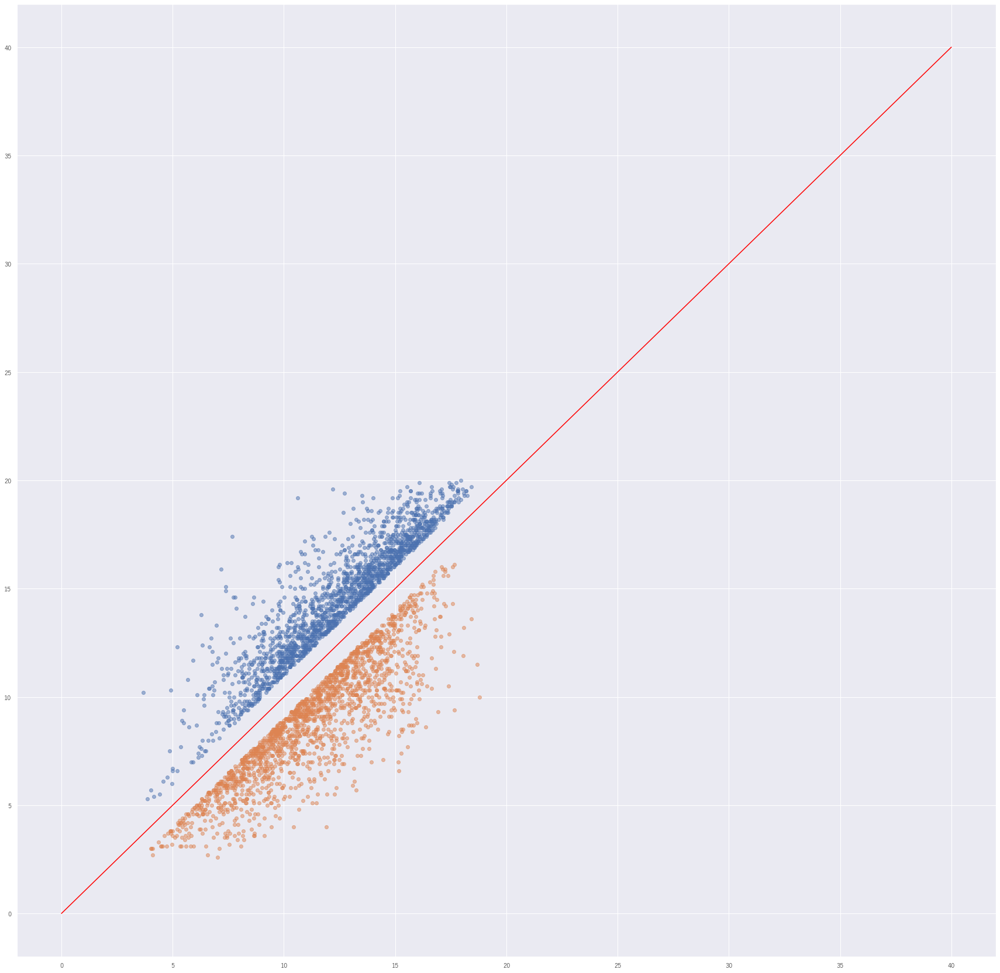

In [104]:
#x軸が予測値，y軸が結果
import matplotlib.pyplot as plt
import numpy as np
plt.scatter(df_error_minus["predict"],df_error_minus[pur], alpha = 0.5)
plt.scatter(df_error_plus["predict"],df_error_plus[pur], alpha = 0.5)
plt.plot(np.linspace(0, 40, 40), np.linspace(0, 40, 40), "red")
plt.show()

(array([179., 152., 182., 187., 159., 192., 223., 187., 195., 209.]),
 array([ 1. ,  2.3,  3.6,  4.9,  6.2,  7.5,  8.8, 10.1, 11.4, 12.7, 14. ]),
 <BarContainer object of 10 artists>)

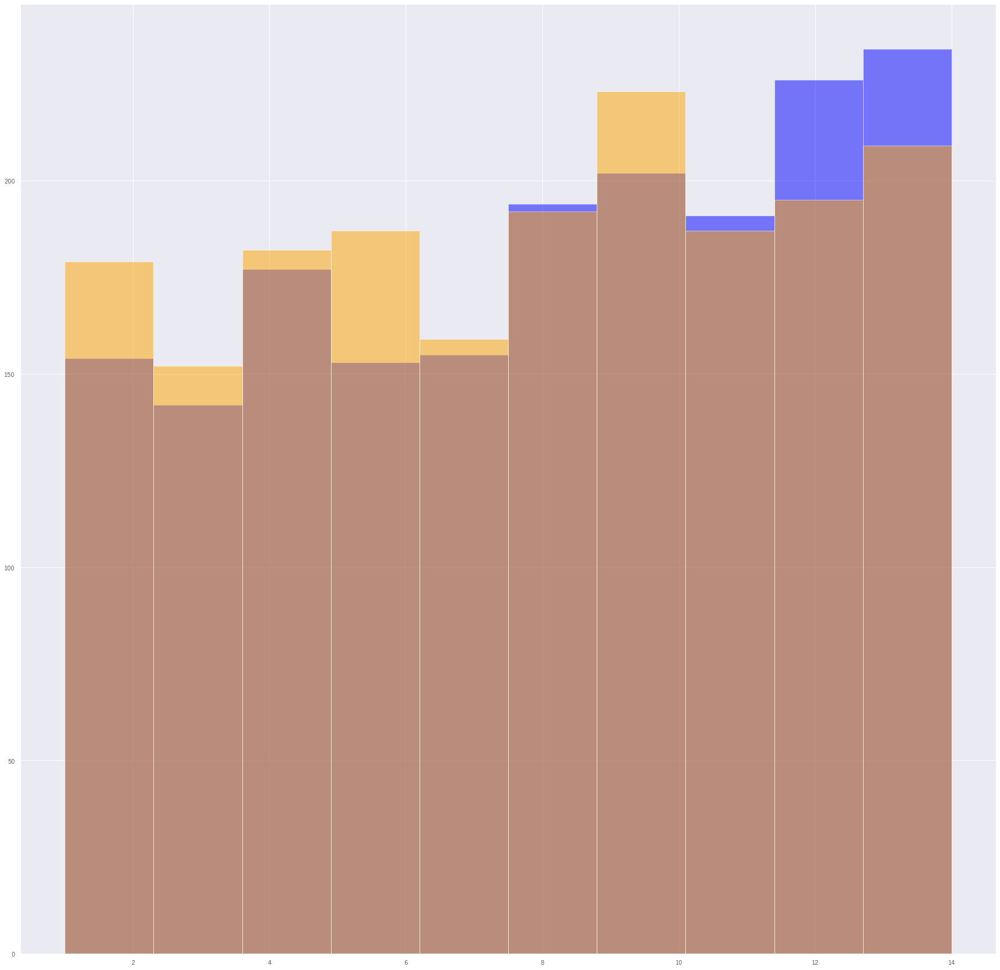

In [105]:
#過大評価
plt.hist(df_error_plus["堤体幅"],alpha=0.5,color="blue")
#過小評価
plt.hist(df_error_minus["堤体幅"],alpha=0.5,color="orange")

## 予測結果の可視化

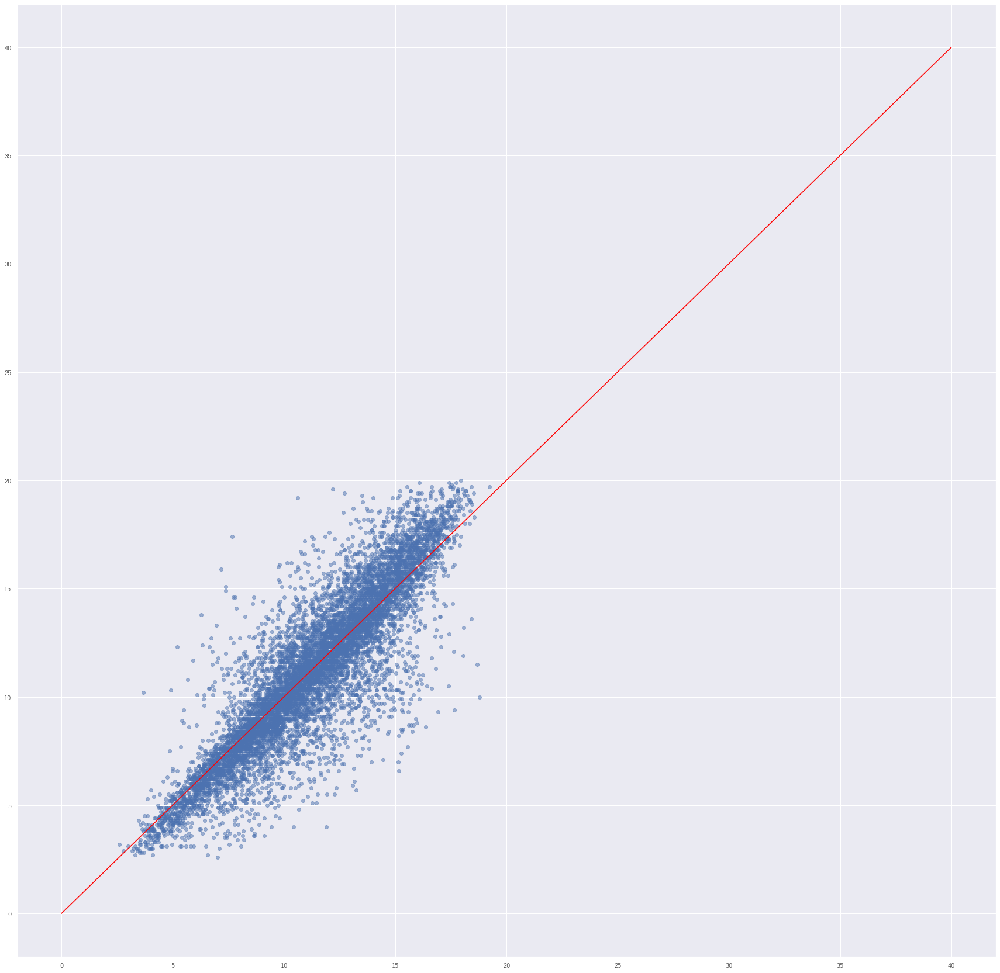

In [106]:
#x軸が予測値，y軸が結果
import matplotlib.pyplot as plt
import numpy as np
plt.scatter(df_pred["predict"],df_pred[pur], alpha = 0.5)
plt.plot(np.linspace(0, 40, 40), np.linspace(0, 40, 40), "red")
plt.show()

###  特徴量重要度

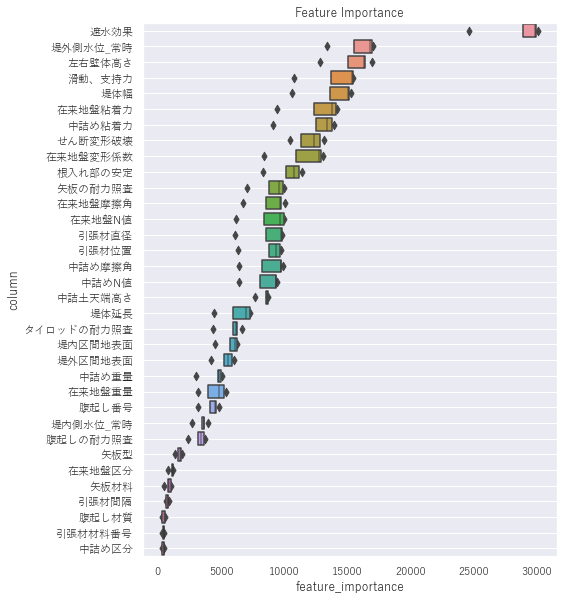

In [107]:
# 5つのモデルで重要度が出てくるので箱ひげ図にします、
def plot_importance(model, X):
    feature_importance_df = pd.DataFrame()
    for i, model in enumerate(models):
        _df = pd.DataFrame()
        _df["feature_importance"] = model.feature_importances_
        _df["column"] = X.columns
        _df["fold"] = i + 1
        feature_importance_df = pd.concat([feature_importance_df, _df], 
                                          axis=0, ignore_index=True)

    order = feature_importance_df.groupby("column").sum()[["feature_importance"]].sort_values("feature_importance", ascending=False).index[:50]

    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x="feature_importance", 
                  y="column", 
                  order=order, 
                  ax=ax, 
                  palette=None,  
                  orient="h")
    ax.tick_params(axis="x")
    ax.set_title("Feature Importance")
    ax.grid()
    fig.tight_layout()
    return fig, ax

fig, ax = plot_importance(models, X)

### shap値個々の値についてしらべる

In [ ]:
def shap_part(val):
    X_predict = df_pred.drop([pur,"predict"], axis=1)
    y_predict = df_pred[pur] 

    for model in models:
        explainer = shap.TreeExplainer(model = model,data=X_predict,feature_perturbation="interventional")
        shap_values = explainer(X_predict)
        shap.plots.waterfall(shap_values=shap_values[val],max_display=20)

In [ ]:
#引数にはデータの何番目の値の詳細を見たいかをいれる．
#モデルごとにwaterfall図が出る．モデルによって異なる．
#f(x):モデルの予測値
#E[f(x)]:モデル予測値全体の平均


# shap_part(1)

In [108]:
# 5つのモデルで重要度が出てくるので箱ひげ図にします、
def plot_importance(model, val):
    X_predict = df_pred.drop([pur,"predict"], axis=1)
    y_predict = df_pred[pur] 

    feature_importance_df = pd.DataFrame()
    for i, model in enumerate(models):
        explainer = shap.TreeExplainer(model = model,data=X_predict,feature_perturbation="interventional")
        shap_values = explainer(X_predict)
        _df = pd.DataFrame()
        _df["shap_values"] = shap_values[val]
        _df["column"] = X_predict.columns
        _df["fold"] = i + 1
        feature_importance_df = pd.concat([feature_importance_df, _df], 
                                          axis=0, ignore_index=True)

    order = feature_importance_df.groupby("column").sum()[["shap_values"]].sort_values("shap_values", ascending=False).index[:50]

    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x="shap_values", 
                  y="column", 
                  order=order, 
                  ax=ax, 
                  palette=None,  
                  orient="h")
    ax.tick_params(axis="x")
    ax.set_title("shap_values")
    ax.grid()
    fig.tight_layout()
    return fig, ax

fig, ax = plot_importance(models, 1)

100%|===================| 8922/8928 [08:32<00:00]        

KeyError: "None of [Index(['shap_values'], dtype='object')] are in the [columns]"